In [ ]:

import os
import shutil
import random
import yaml
import xml.etree.ElementTree as ET
from pathlib import Path
import kagglehub
import pandas as pd
import numpy as np
import cv2
from concurrent.futures import ProcessPoolExecutor
from tqdm import tqdm
import zipfile


print("1. 고속 처리를 위한 환경 설정 (Colab 로컬 사용)")


from google.colab import drive
drive.mount('/content/drive', force_remount=True)


workspace_root = Path('/content/workspace')
if workspace_root.exists():
    shutil.rmtree(workspace_root)
workspace_root.mkdir(parents=True, exist_ok=True)


drive_save_dir = Path('/content/drive/MyDrive/PCB_defect_detection_Project')
drive_save_dir.mkdir(parents=True, exist_ok=True)

print(f"작업 공간 생성 완료: {workspace_root}")


print("\n2. 데이터셋 다운로드 (Kaggle -> Colab Local)")
dataset_name = 'akhatova/pcb-defects'
kaggle_download_path = Path(kagglehub.dataset_download(dataset_name))
raw_dataset_path = workspace_root / 'raw_data'


shutil.copytree(kaggle_download_path / 'PCB_DATASET', raw_dataset_path, dirs_exist_ok=True)

images_dir = raw_dataset_path / 'images'
annot_dir = raw_dataset_path / 'Annotations'
print("데이터 준비 완료.\n")


print("3. XML 어노테이션 파싱")
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    filename = root.find('filename').text
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    data = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)
        data.append({
            'filename': filename, 'width': width, 'height': height,
            'class': name, 'xmin': xmin, 'ymin': ymin, 'xmax': xmax, 'ymax': ymax
        })
    return data

xml_file_paths = list(annot_dir.rglob('*.xml'))

df_list = [pd.DataFrame(parse_xml(p)) for p in xml_file_paths]
annot_df = pd.concat(df_list, ignore_index=True)
print(f"총 {len(annot_df)}개의 객체 파싱 완료.")

print("\n4. 병렬 처리를 이용한 이미지 리사이즈 및 좌표 변환")

def process_single_image(args):
    """병렬 처리를 위한 단위 작업 함수"""
    row, input_dir, output_dir, target_size = args


    try:
        image_path = list(input_dir.rglob(row['filename']))[0]
        image = cv2.imread(str(image_path))

        if image is None:
            return None

        resized_image = cv2.resize(image, target_size)
        output_path = output_dir / row['filename']
        cv2.imwrite(str(output_path), resized_image)

        w_ratio = target_size[0] / row['width']
        h_ratio = target_size[1] / row['height']

        return {
            'filename': row['filename'],
            'width': target_size[0], 'height': target_size[1],
            'class': row['class'],
            'xmin': int(row['xmin'] * w_ratio), 'ymin': int(row['ymin'] * h_ratio),
            'xmax': int(row['xmax'] * w_ratio), 'ymax': int(row['ymax'] * h_ratio)
        }
    except Exception as e:
        return None

resized_img_dir = workspace_root / 'images_resized'
resized_img_dir.mkdir(parents=True, exist_ok=True)


unique_files = annot_df[['filename', 'width', 'height']].drop_duplicates()
resize_tasks = []

for _, row in unique_files.iterrows():
    resize_tasks.append((row, images_dir, resized_img_dir, (640, 640)))

print(f"이미지 리사이즈 작업 시작 ({len(resize_tasks)}장)... CPU 코어 사용")


with ProcessPoolExecutor() as executor:

    list(tqdm(executor.map(process_single_image, resize_tasks), total=len(resize_tasks)))


annot_df_resized = annot_df.copy()
annot_df_resized['xmin'] = (annot_df_resized['xmin'] * (640 / annot_df_resized['width'])).astype(int)
annot_df_resized['xmax'] = (annot_df_resized['xmax'] * (640 / annot_df_resized['width'])).astype(int)
annot_df_resized['ymin'] = (annot_df_resized['ymin'] * (640 / annot_df_resized['height'])).astype(int)
annot_df_resized['ymax'] = (annot_df_resized['ymax'] * (640 / annot_df_resized['height'])).astype(int)
annot_df_resized['width'] = 640
annot_df_resized['height'] = 640

print("이미지 처리 완료.")


print("\n5. 데이터셋 분할 및 YOLO 라벨 생성")

classes = ['missing_hole', 'mouse_bite', 'open_circuit', 'short', 'spur', 'spurious_copper']


def create_yolo_labels_vectorized(df, classes):
    df['class_id'] = df['class'].apply(lambda x: classes.index(x.lower()))
    df['x_center'] = ((df['xmin'] + df['xmax']) / 2) / df['width']
    df['y_center'] = ((df['ymin'] + df['ymax']) / 2) / df['height']
    df['bbox_w'] = (df['xmax'] - df['xmin']) / df['width']
    df['bbox_h'] = (df['ymax'] - df['ymin']) / df['height']
    return df

yolo_df = create_yolo_labels_vectorized(annot_df_resized, classes)

output_dir_processed = workspace_root / 'data_processed'
for split in ['train', 'val', 'test']:
    (output_dir_processed / 'images' / split).mkdir(parents=True, exist_ok=True)
    (output_dir_processed / 'labels' / split).mkdir(parents=True, exist_ok=True)


unique_filenames = yolo_df['filename'].unique()
np.random.shuffle(unique_filenames)

train_end = int(len(unique_filenames) * 0.8)
val_end = train_end + int(len(unique_filenames) * 0.1)

splits = {
    'train': unique_filenames[:train_end],
    'val': unique_filenames[train_end:val_end],
    'test': unique_filenames[val_end:]
}

print("파일 이동 및 라벨 파일 생성 중...")
for split, filenames in splits.items():
    for fname in tqdm(filenames, desc=f"Processing {split}"):

        src_img = resized_img_dir / fname
        dst_img = output_dir_processed / 'images' / split / fname
        if src_img.exists():
            shutil.copy(src_img, dst_img)


        file_objects = yolo_df[yolo_df['filename'] == fname]
        label_path = output_dir_processed / 'labels' / split / f"{Path(fname).stem}.txt"

        with open(label_path, 'w') as f:
            for _, row in file_objects.iterrows():
                f.write(f"{int(row['class_id'])} {row['x_center']:.6f} {row['y_center']:.6f} {row['bbox_w']:.6f} {row['bbox_h']:.6f}\n")

import os
import shutil
from pathlib import Path

print("\n6. 결과물 압축 및 드라이브 업로드 (수정됨)")


workspace_root = Path('/content/workspace')
output_dir_processed = workspace_root / 'data_processed'
drive_save_dir = Path('/content/drive/MyDrive/PCB_defect_detection_Project')


base_name = workspace_root / 'data_processed'
shutil.make_archive(str(base_name), 'zip', output_dir_processed)


generated_zip = workspace_root / 'data_processed.zip'
final_dest = drive_save_dir / 'data_processed.zip'


if not drive_save_dir.exists():
    print(f" 경고: 드라이브 폴더가 없어서 새로 생성합니다: {drive_save_dir}")
    drive_save_dir.mkdir(parents=True, exist_ok=True)


if generated_zip.exists():
    try:
        shutil.copy(str(generated_zip), final_dest)
        print(f" 모든 처리가 완료되었습니다.")
        print(f"결과물(Zip)이 구글 드라이브에 저장되었습니다: {final_dest}")


        size_mb = os.path.getsize(final_dest) / (1024 * 1024)
        print(f"저장된 파일 크기: {size_mb:.2f} MB")

    except Exception as e:
        print(f" 복사 중 에러 발생: {e}")
        print("구글 드라이브 마운트가 끊겼거나, 권한 문제가 있을 수 있습니다.")
else:
    print(f" 오류: 압축 파일이 생성되지 않았습니다. 경로를 확인해주세요: {generated_zip}")

1. 고속 처리를 위한 환경 설정 (Colab 로컬 사용)
Mounted at /content/drive
작업 공간 생성 완료: /content/workspace

2. 데이터셋 다운로드 (Kaggle -> Colab Local)
Using Colab cache for faster access to the 'pcb-defects' dataset.
데이터 준비 완료.

3. XML 어노테이션 파싱
총 2953개의 객체 파싱 완료.

4. 병렬 처리를 이용한 이미지 리사이즈 및 좌표 변환
이미지 리사이즈 작업 시작 (693장)... CPU 코어 사용


100%|██████████| 693/693 [00:31<00:00, 21.97it/s]


이미지 처리 완료.

5. 데이터셋 분할 및 YOLO 라벨 생성
파일 이동 및 라벨 파일 생성 중...


Processing test: 100%|██████████| 70/70 [00:00<00:00, 613.87it/s]



6. 결과물 압축 및 드라이브 업로드 (수정됨)
 모든 처리가 완료되었습니다.
결과물(Zip)이 구글 드라이브에 저장되었습니다: /content/drive/MyDrive/PCB_defect_detection_Project/data_processed.zip
저장된 파일 크기: 109.85 MB


In [ ]:
!pip install ultralytics
import zipfile
import os
from pathlib import Path
import shutil
from ultralytics import YOLO


project_root = Path('/content/drive/MyDrive/PCB_defect_detection_Project')
zip_file_path = project_root / 'data_processed.zip'
extract_path = Path('/content/dataset')


print(f" 압축 파일 확인 중: {zip_file_path}")

if not zip_file_path.exists():
    print(f" 오류: {zip_file_path} 파일을 찾을 수 없습니다.")
    print("파일 이름이 정확한지, .zip 확장자가 붙어있는지 확인해주세요.")
else:
    print(" 압축 해제 시작 (Colab 로컬 공간으로)...")

    if extract_path.exists():
        shutil.rmtree(extract_path)
    extract_path.mkdir(parents=True, exist_ok=True)

    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print(" 압축 해제 완료!")


dataset_root = extract_path
if (extract_path / 'data_processed').exists():
    dataset_root = extract_path / 'data_processed'

print(f"📍 데이터셋 루트 경로: {dataset_root}")


if not (dataset_root / 'images/val').exists():

    if (dataset_root / 'images/valid').exists():
        val_dir = 'images/valid'
        print("ℹ 알림: 'val' 대신 'valid' 폴더가 감지되었습니다.")
    elif (dataset_root / 'images/test').exists():
        val_dir = 'images/test'
        print("ℹ 알림: 'val' 대신 'test' 폴더가 감지되었습니다.")
    else:

        val_dir = 'images/train'
        print(" 경고: 검증용 폴더를 찾지 못해 'images/train'을 검증용으로 함께 사용합니다.")
else:
    val_dir = 'images/val'



print("===== data.yaml 파일 생성 =====")

classes = ['missing_hole', 'mouse_bite', 'open_circuit',
           'short', 'spur', 'spurious_copper']

all_data_yaml_content = f"""
path: {dataset_root.as_posix()}
train: images/train
val: {val_dir}
names:
  0: {classes[0]}
  1: {classes[1]}
  2: {classes[2]}
  3: {classes[3]}
  4: {classes[4]}
  5: {classes[5]}
"""


yaml_path = project_root / 'data.yaml'
with open(yaml_path, 'w') as f:
    f.write(all_data_yaml_content)
print(f"data.yaml 저장 완료: {yaml_path}")



print("\n===== 모델 학습 시작 =====")
results_base_dir_colab = Path('/content/pcb_results')
dest_results_dir_drive = project_root / 'results'

model = YOLO('yolo11s.pt')

try:
    results = model.train(
        data=str(yaml_path),
        epochs=100,
        batch=16,
        imgsz=640,
        project=str(results_base_dir_colab),
        name='yolo11s_run',
        exist_ok=True,
        hsv_h=0.0,
        hsv_s=0.0,
        hsv_v=0.0,
        degrees=10.0,
        fliplr=0.0,
        mixup=0.3
    )


    print(" 학습 결과를 Google Drive로 복사 중...")
    source_dir = results_base_dir_colab / 'yolo11s_run'
    dest_dir = dest_results_dir_drive / 'yolo11s_run'
    shutil.copytree(source_dir, dest_dir, dirs_exist_ok=True)
    print(f" 모든 과정 완료! 결과 위치: {dest_dir}")

except Exception as e:
    print(f"\n 학습 중 오류 발생: {e}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 28.9 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
 압축 파일 확인 중: /content/drive/MyDrive/PCB_defect_detection_Project/data_processed.zip
 압축 해제 시작 (Colab 로컬 공간으로)...
 압축 해제 완료!
📍 데이터셋 루트 경로: /content/dataset
===== data.yaml 파일 생성 =====
data.yaml 저장 완료: /content/drive/MyDrive/PCB_defect_detection_Project/data.yaml

===== 모델 학습 시작 =====
Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos


===== 4. 학습 결과 시각화 및 저장 =====


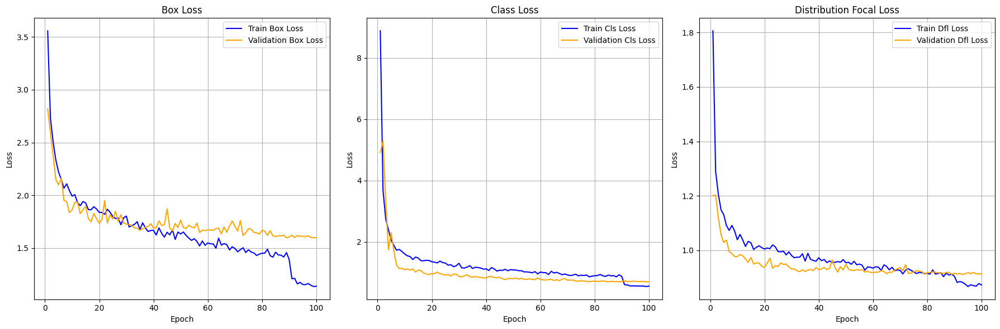

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path


print("\n===== 4. 학습 결과 시각화 및 저장 =====")


results_dir_colab = Path('/content/pcb_results') / 'yolo11s_run'


results_csv_path = results_dir_colab / 'results.csv'

if results_csv_path.exists():

    results_df = pd.read_csv(results_csv_path)


    results_df.columns = results_df.columns.str.strip()


    epochs = results_df['epoch']
    train_box_loss = results_df['train/box_loss']
    val_box_loss = results_df['val/box_loss']
    train_cls_loss = results_df['train/cls_loss']
    val_cls_loss = results_df['val/cls_loss']
    train_dfl_loss = results_df['train/dfl_loss']
    val_dfl_loss = results_df['val/dfl_loss']


    fig, axs = plt.subplots(1, 3, figsize=(18, 6))


    axs[0].plot(epochs, train_box_loss, label='Train Box Loss', color='blue')
    axs[0].plot(epochs, val_box_loss, label='Validation Box Loss', color='orange')
    axs[0].set_title('Box Loss')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    axs[0].legend()
    axs[0].grid(True)


    axs[1].plot(epochs, train_cls_loss, label='Train Cls Loss', color='blue')
    axs[1].plot(epochs, val_cls_loss, label='Validation Cls Loss', color='orange')
    axs[1].set_title('Class Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)


    axs[2].plot(epochs, train_dfl_loss, label='Train Dfl Loss', color='blue')
    axs[2].plot(epochs, val_dfl_loss, label='Validation Dfl Loss', color='orange')
    axs[2].set_title('Distribution Focal Loss')
    axs[2].set_xlabel('Epoch')
    axs[2].set_ylabel('Loss')
    axs[2].legend()
    axs[2].grid(True)

    plt.tight_layout()
    plt.show()
else:
    print(f" 오류: {results_csv_path} 파일을 찾을 수 없습니다. 학습 결과 폴더를 확인해주세요.")


===== 4. 학습 결과 자동 시각화 (생성된 이미지 로드) =====
 결과 파일 읽기 경로: /content/pcb_results/yolo11s_run


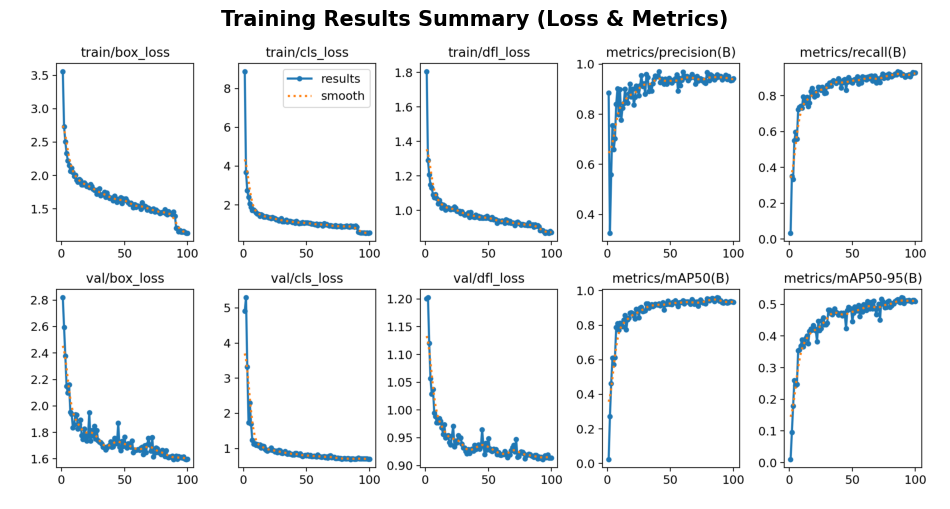

 출력 완료: Training Results Summary (Loss & Metrics)


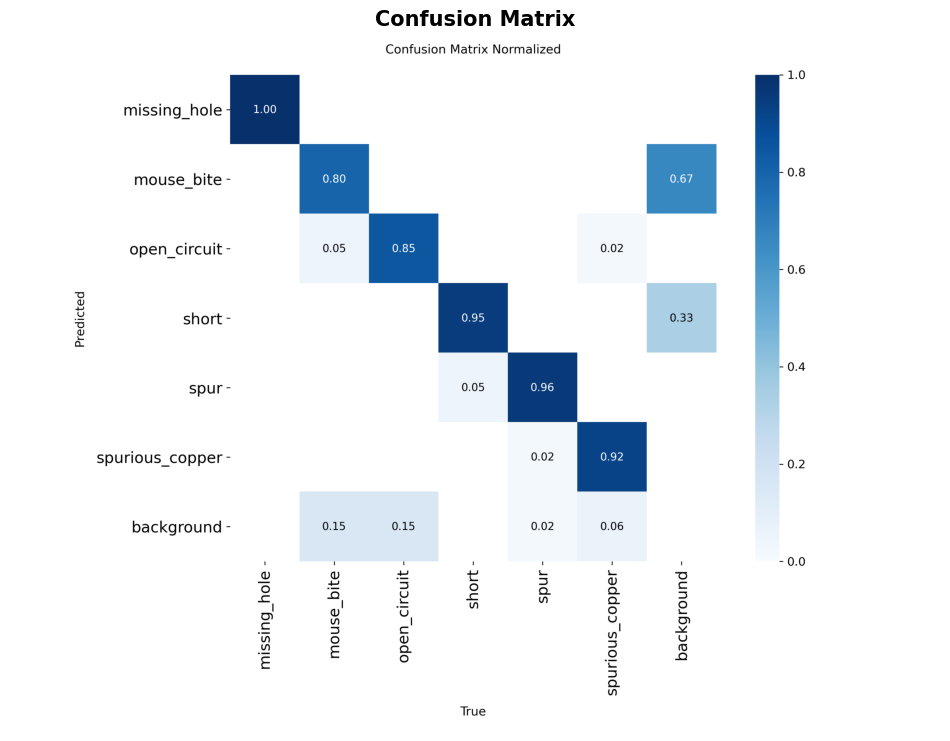

 출력 완료: Confusion Matrix


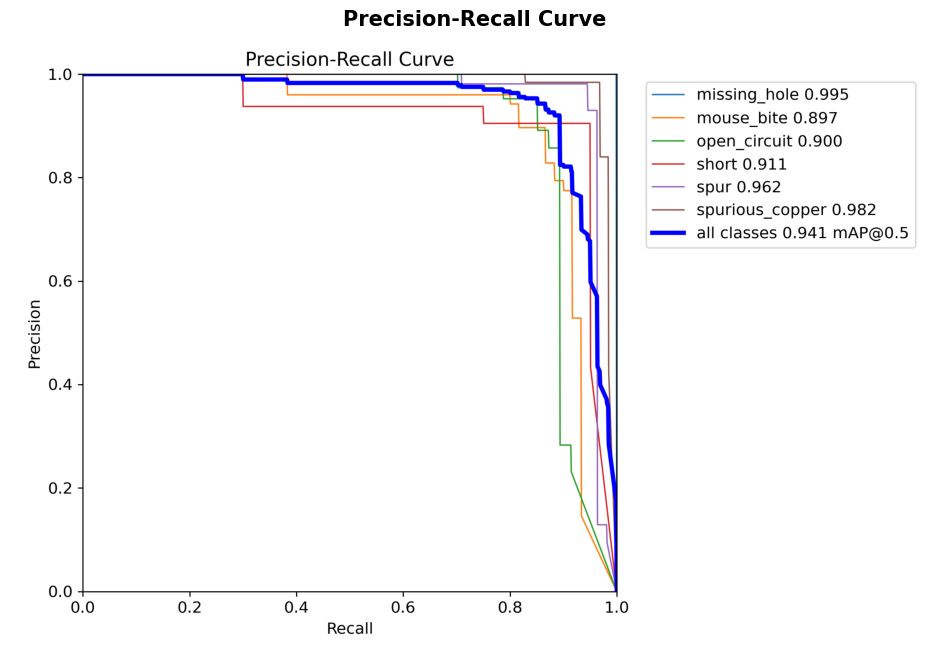

 출력 완료: Precision-Recall Curve


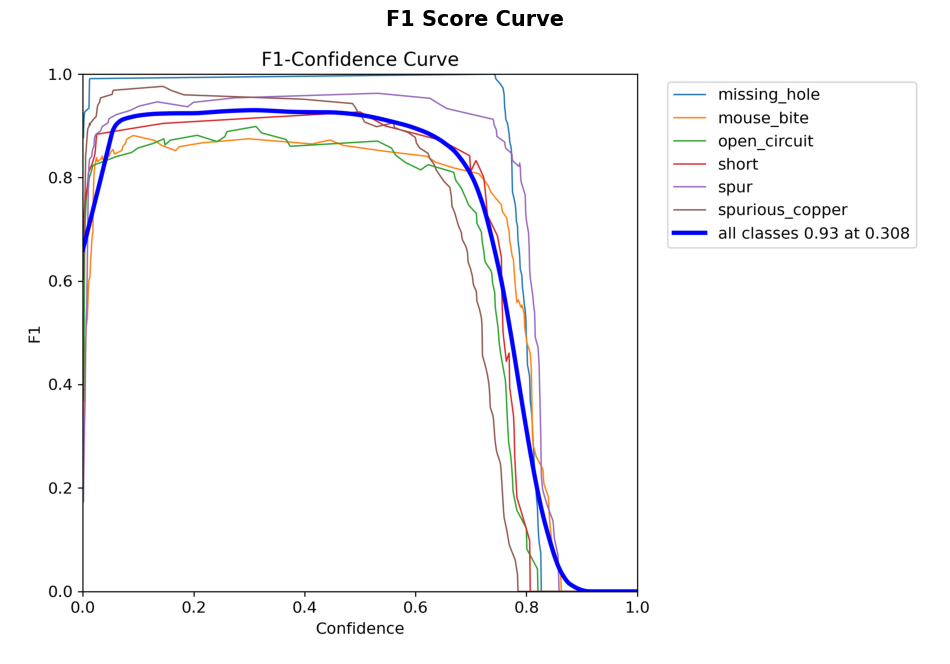

 출력 완료: F1 Score Curve

=====  실제 검증 이미지 예측 결과 (3장 중 3장) =====


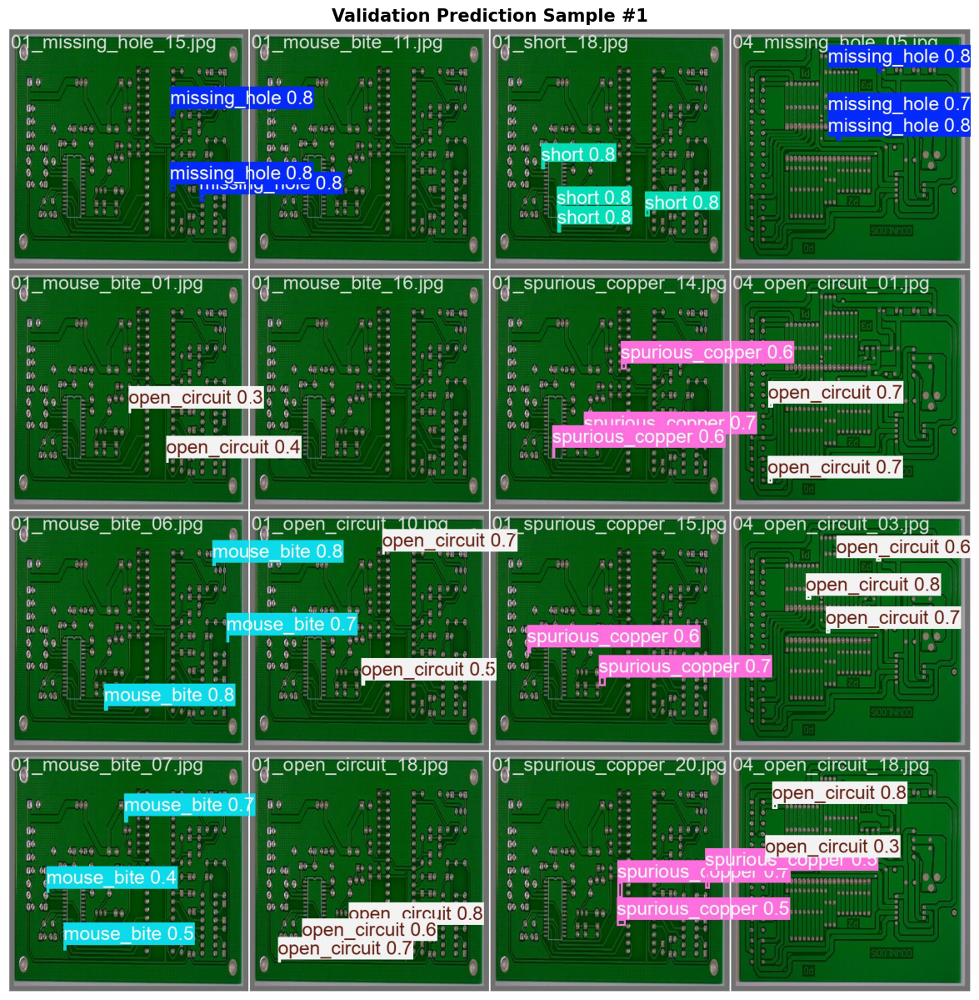

 출력 완료: Validation Prediction Sample #1


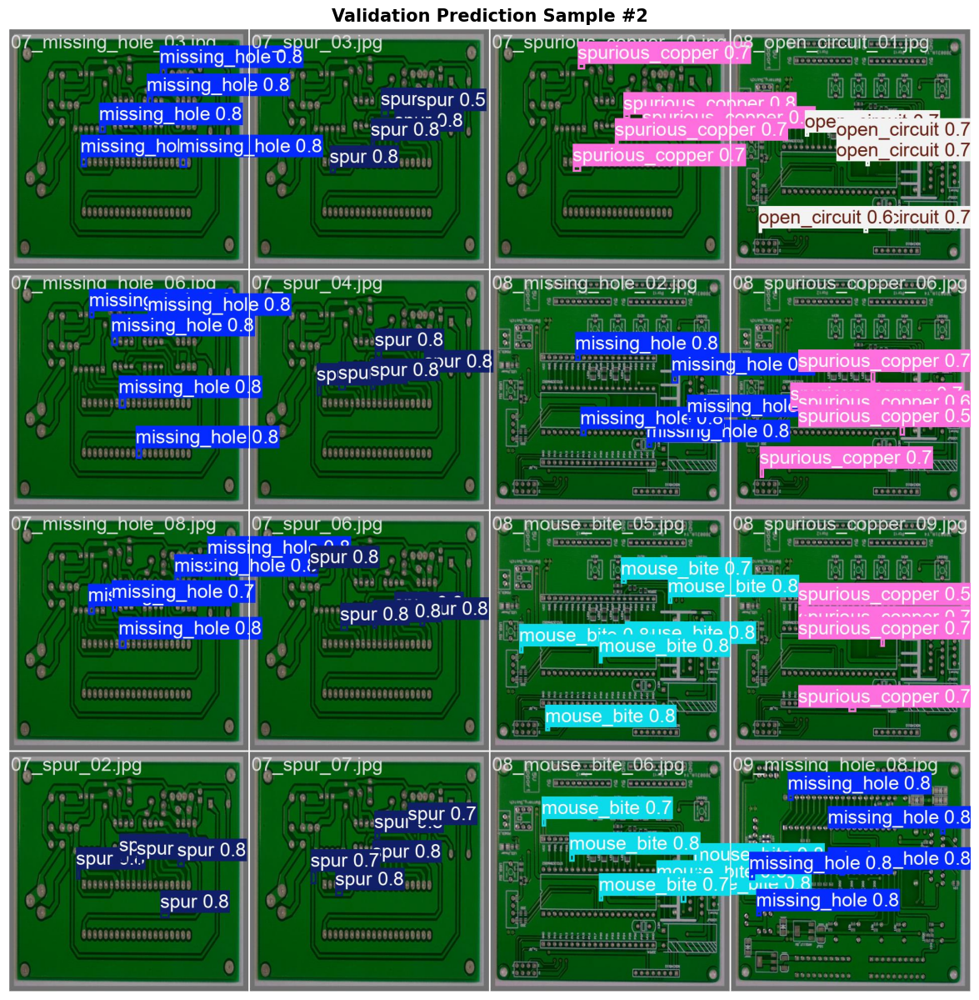

 출력 완료: Validation Prediction Sample #2


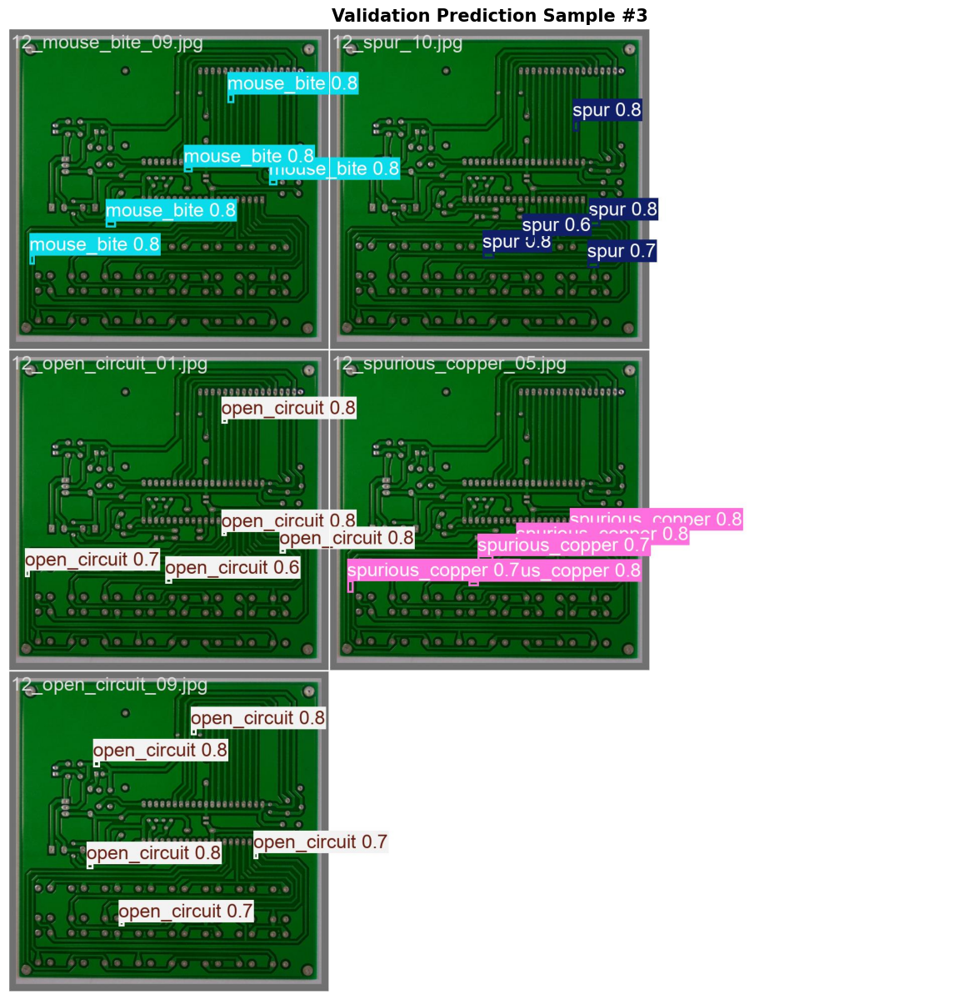

 출력 완료: Validation Prediction Sample #3

===== 모든 시각화 완료 =====


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path
import glob


print("\n===== 4. 학습 결과 자동 시각화 (생성된 이미지 로드) =====")

def show_result_image(image_path, title="Result Image", figsize=(12, 10)):
    """이미지 경로를 받아 Matplotlib으로 시각화하는 함수"""
    if image_path.exists():
        img = mpimg.imread(str(image_path))
        plt.figure(figsize=figsize)
        plt.imshow(img)
        plt.title(title, fontsize=15, fontweight='bold')
        plt.axis('off')
        plt.show()
        print(f" 출력 완료: {title}")
    else:
        print(f" 파일을 찾을 수 없음: {title} ({image_path.name})")


current_result_dir = results_dir_colab

print(f" 결과 파일 읽기 경로: {current_result_dir}")


show_result_image(current_result_dir / 'results.png', title="Training Results Summary (Loss & Metrics)")


cm_path = current_result_dir / 'confusion_matrix_normalized.png'
if not cm_path.exists():
    cm_path = current_result_dir / 'confusion_matrix.png'
show_result_image(cm_path, title="Confusion Matrix")

show_result_image(current_result_dir / 'BoxPR_curve.png', title="Precision-Recall Curve")


show_result_image(current_result_dir / 'BoxF1_curve.png', title="F1 Score Curve")


pred_images = sorted(list(current_result_dir.glob('val_batch*_pred.jpg')))

if pred_images:
    print(f"\n=====  실제 검증 이미지 예측 결과 ({len(pred_images)}장 중 3장) =====")
    for i, img_path in enumerate(pred_images[:3]):
        show_result_image(img_path, title=f"Validation Prediction Sample #{i+1}", figsize=(15, 15))
else:
    print("\n 검증 예측 이미지(val_batch*_pred.jpg)를 찾을 수 없습니다.")

print("\n===== 모든 시각화 완료 =====")

 프로젝트 루트: /content/drive/MyDrive/PCB_defect_detection_Project
 설정 파일: /content/drive/MyDrive/PCB_defect_detection_Project/data.yaml
 data.yaml에 Test 경로가 성공적으로 등록되었습니다!

 구글 드라이브 데이터를 사용하여 Test 성능 검증 시작...
Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1491.2±784.6 MB/s, size: 162.8 KB)
val: Scanning /content/dataset/labels/test... 70 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 70/70 1.7Kit/s 0.0s
val: New cache created: /content/dataset/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 5/5 1.4it/s 3.5s
                   all         70        294       0.98      0.947      0.976      0.533
          missing_hole         11         50          1      0.993      0.995      0.634
            mouse_bite         12         49      0.993     

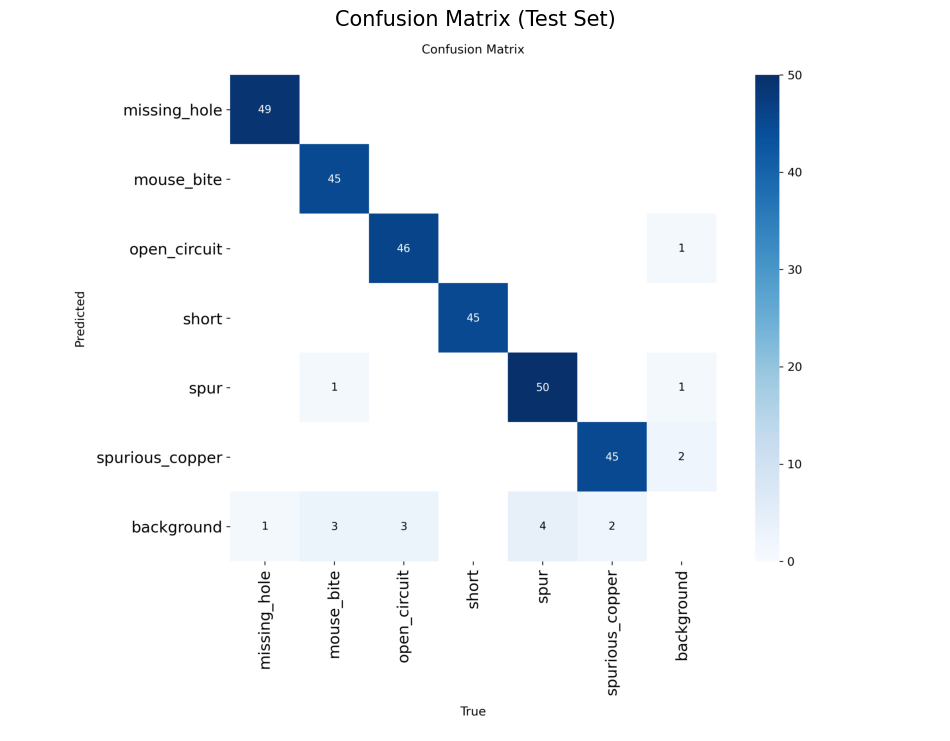

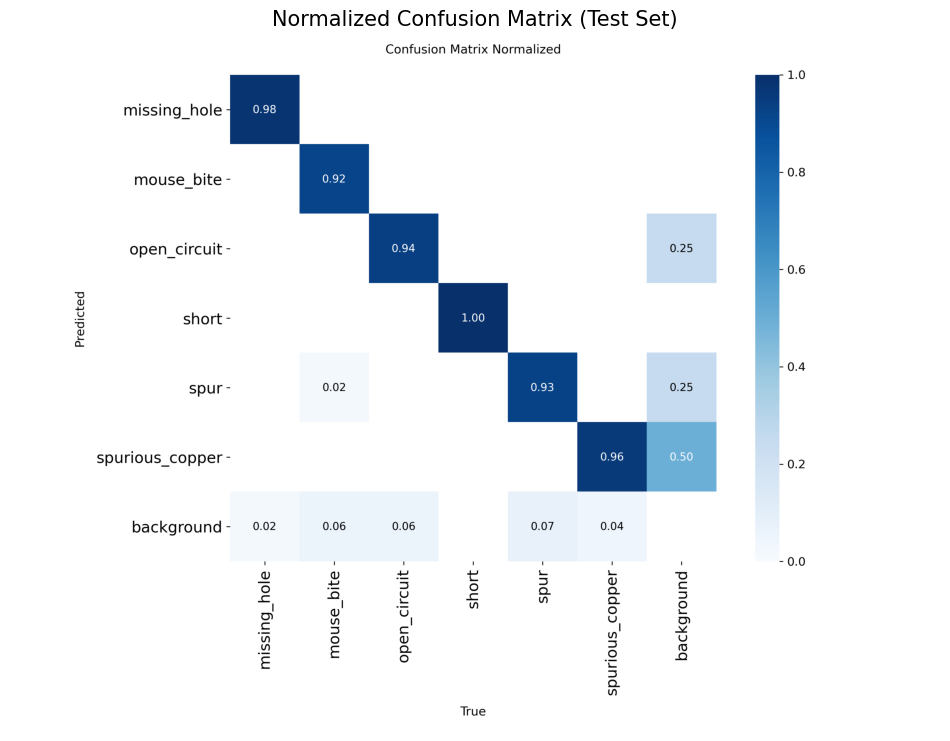


Test Set mAP50: 0.9758


In [ ]:
import yaml
from pathlib import Path
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


project_root = Path('/content/drive/MyDrive/PCB_defect_detection_Project')


yaml_file_path = project_root / 'data.yaml'



print(f" 프로젝트 루트: {project_root}")
print(f" 설정 파일: {yaml_file_path}")

if not yaml_file_path.exists():
    print(f" 오류: {yaml_file_path} 파일을 찾을 수 없습니다.")
    print("구글 드라이브 마운트가 되어 있는지, 경로가 정확한지 확인해주세요.")
else:

    with open(yaml_file_path, 'r') as f:
        data = yaml.safe_load(f)


    data['test'] = 'images/test'


    with open(yaml_file_path, 'w') as f:
        yaml.dump(data, f)

    print(f" data.yaml에 Test 경로가 성공적으로 등록되었습니다!")



    print("\n 구글 드라이브 데이터를 사용하여 Test 성능 검증 시작...")

    metrics = model.val(data=str(yaml_file_path), split='test', plots=True)


    save_dir = Path(metrics.save_dir)
    cm_path = save_dir / 'confusion_matrix.png'
    cm_norm_path = save_dir / 'confusion_matrix_normalized.png'

    def show_result_image(img_path, title):
        if img_path.exists():
            img = mpimg.imread(str(img_path))
            plt.figure(figsize=(12, 10))
            plt.imshow(img)
            plt.title(title, fontsize=15)
            plt.axis('off')
            plt.show()
        else:
            print(f" 이미지를 찾을 수 없습니다: {img_path}")

    print(f"\n=== 결과 이미지 저장 경로: {save_dir} ===")
    show_result_image(cm_path, "Confusion Matrix (Test Set)")
    show_result_image(cm_norm_path, "Normalized Confusion Matrix (Test Set)")

    print(f"\nTest Set mAP50: {metrics.box.map50:.4f}")

 폴더 확인 중: /content/runs/detect/val
 생성된 파일 목록: ['BoxF1_curve.png', 'val_batch1_labels.jpg', 'val_batch0_pred.jpg', 'val_batch2_labels.jpg', 'BoxR_curve.png', 'val_batch0_labels.jpg', 'confusion_matrix.png', 'val_batch1_pred.jpg', 'val_batch2_pred.jpg', 'confusion_matrix_normalized.png', 'BoxP_curve.png', 'BoxPR_curve.png']

 총 12개의 그래프를 발견했습니다. 출력을 시작합니다...



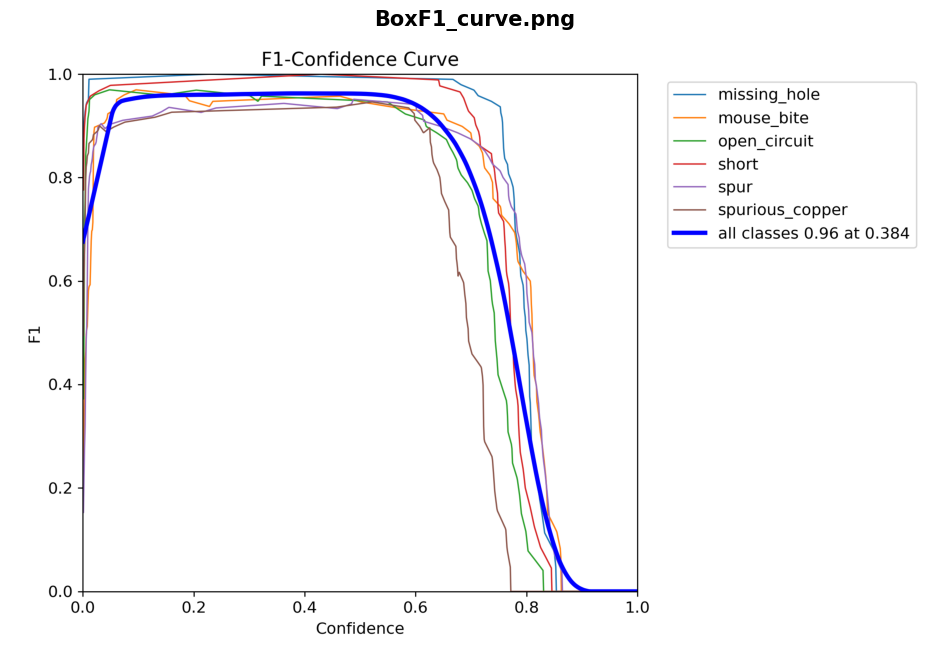

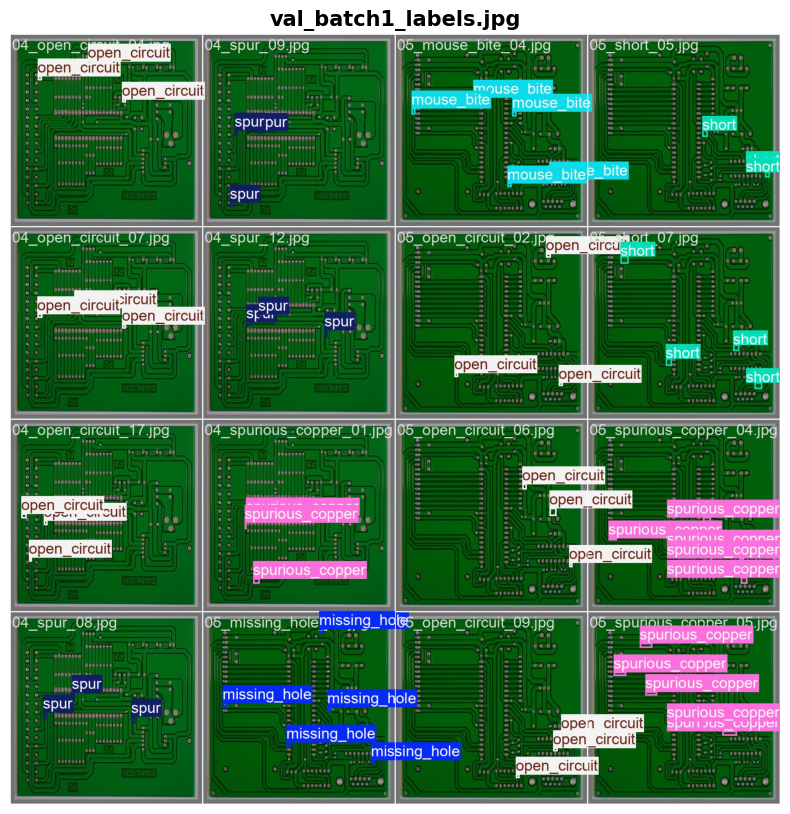

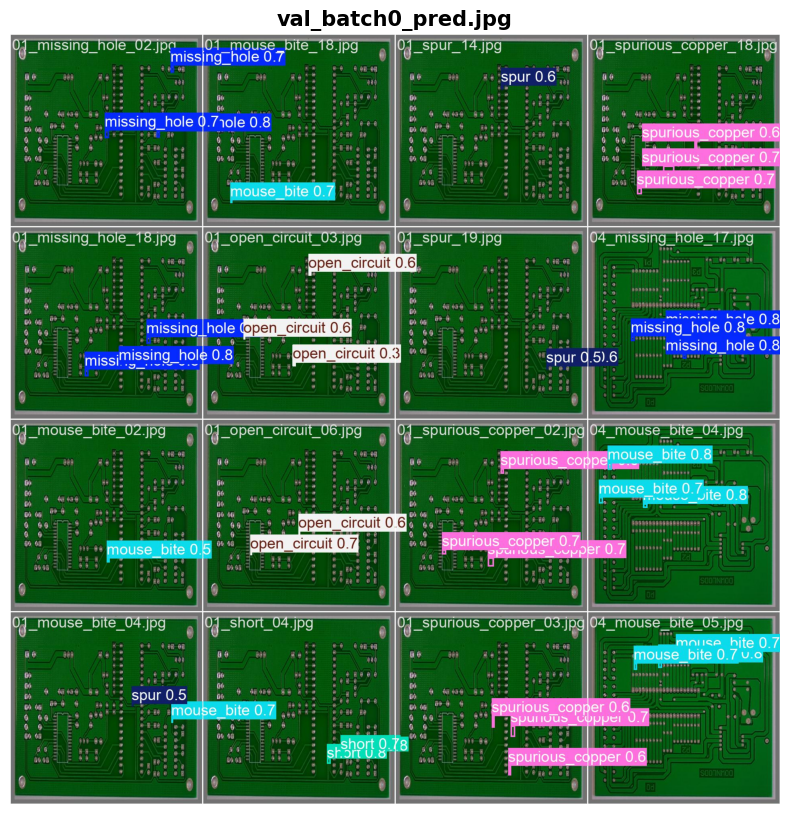

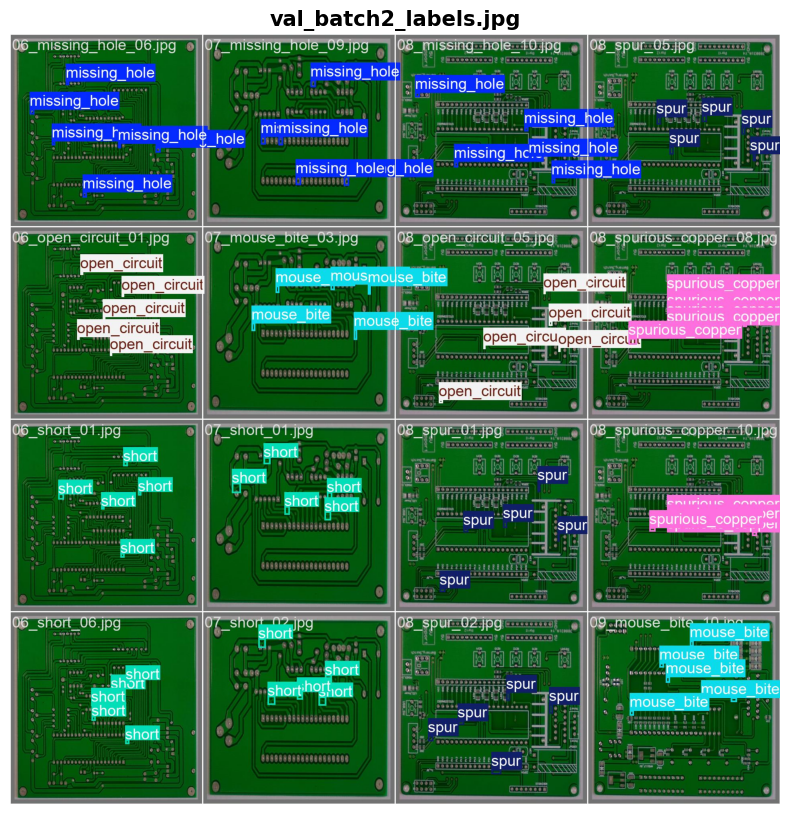

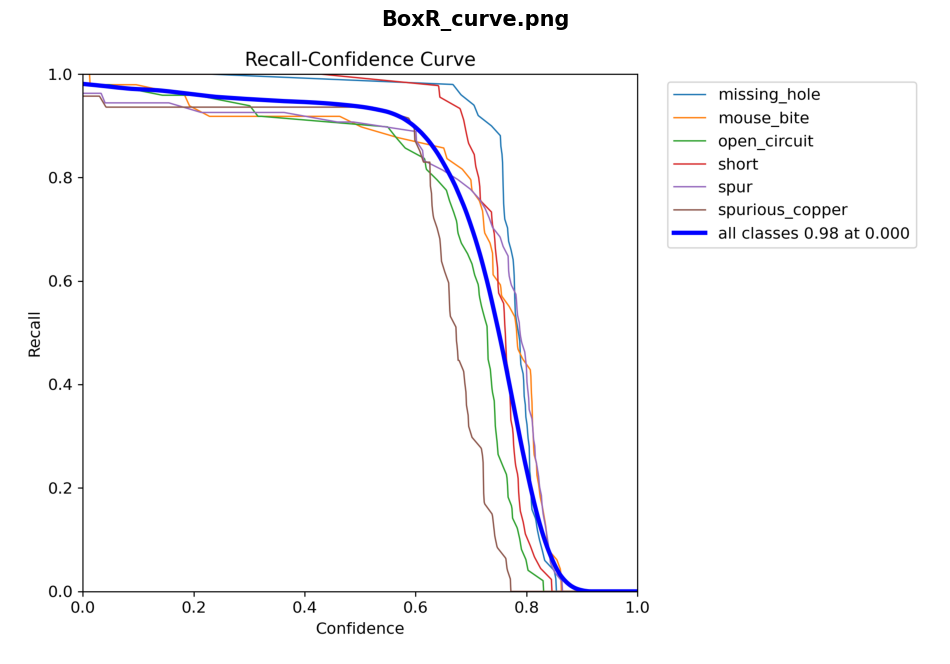

...

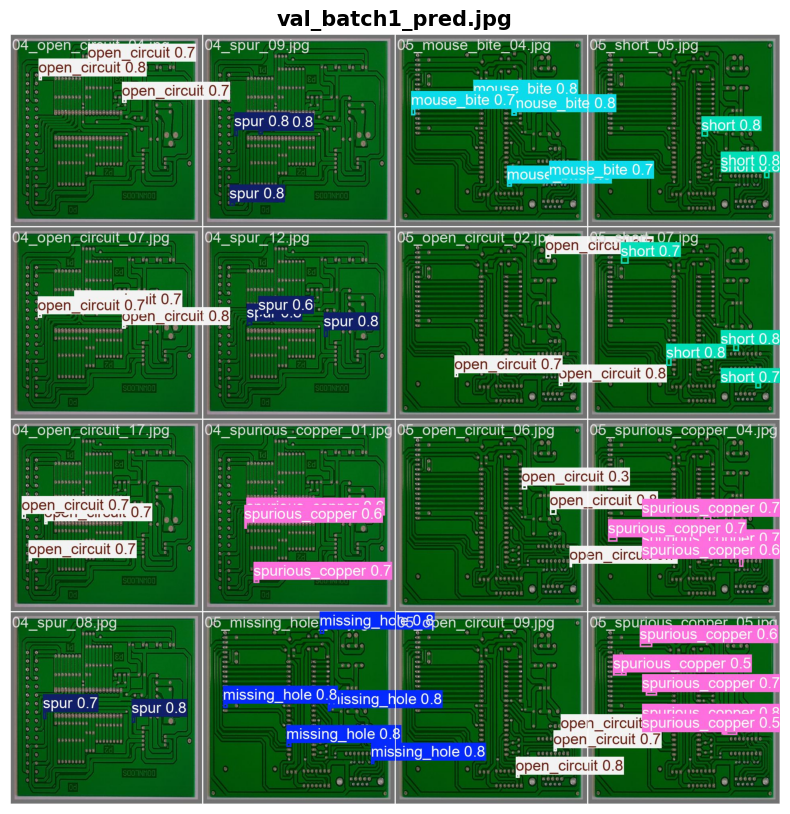

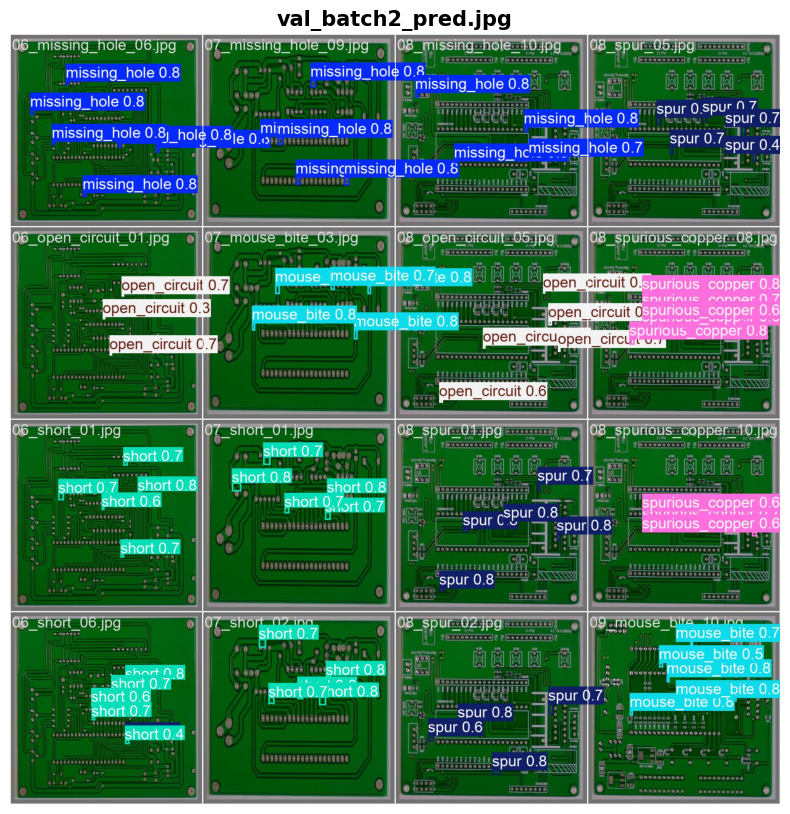

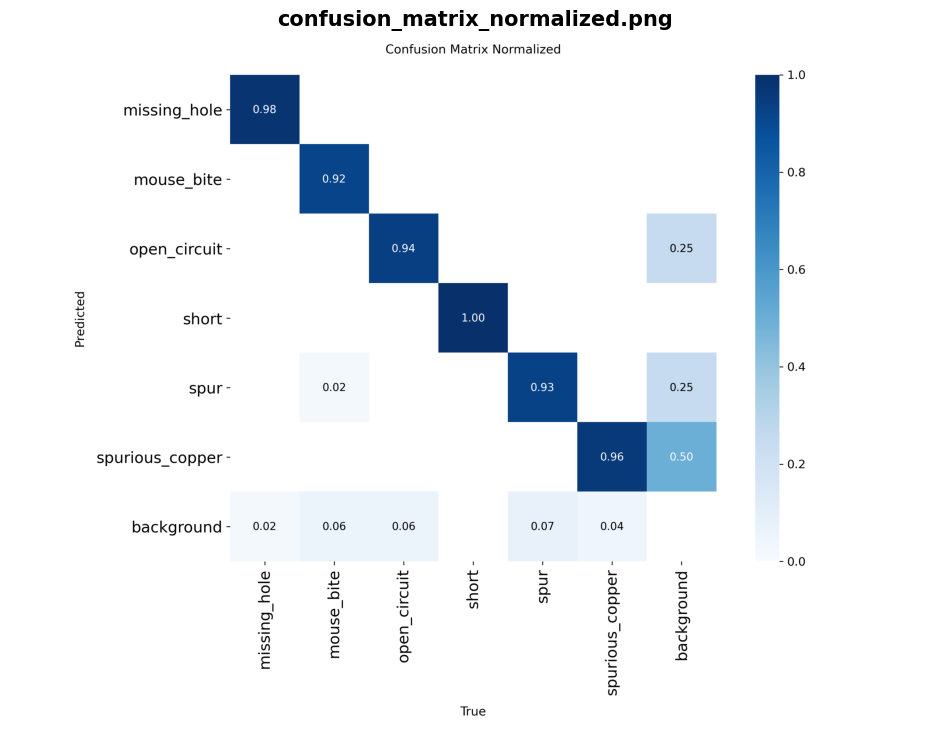

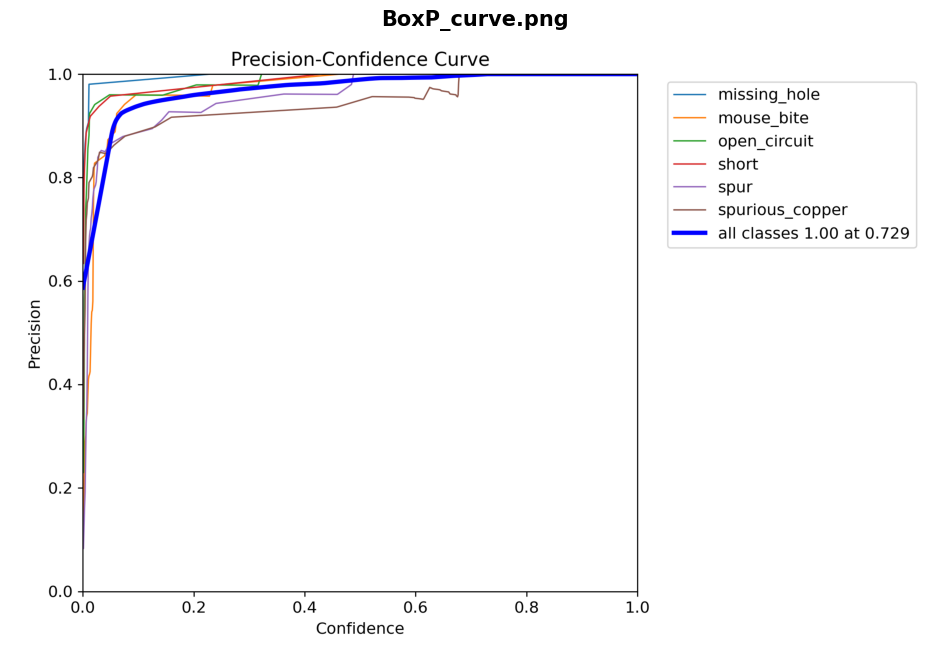

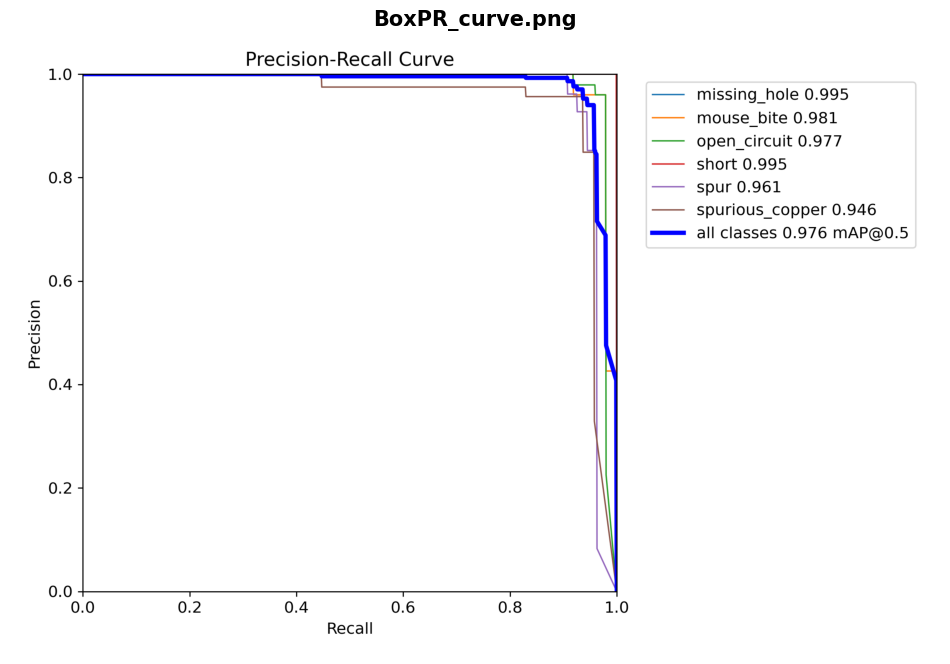

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path


save_dir = Path('/content/runs/detect/val')

print(f" 폴더 확인 중: {save_dir}")

if not save_dir.exists():
    print(" 오류: 해당 경로를 찾을 수 없습니다.")
else:

    all_files = os.listdir(save_dir)
    print(f" 생성된 파일 목록: {all_files}")


    image_files = [f for f in all_files if f.endswith('.png') or f.endswith('.jpg')]

    if not image_files:
        print(" 경고: 이 폴더 안에 이미지 파일이 하나도 없습니다.")
    else:
        print(f"\n 총 {len(image_files)}개의 그래프를 발견했습니다. 출력을 시작합니다...\n")

        for img_file in image_files:


            img_path = save_dir / img_file
            img = mpimg.imread(str(img_path))

            plt.figure(figsize=(12, 10))
            plt.imshow(img)
            plt.title(img_file, fontsize=15, fontweight='bold')
            plt.axis('off')
            plt.show()